In [1]:
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import glob
import json
import requests
from io import StringIO
import numpy as np
import seaborn as sns
sns.set()
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

In [2]:
startDate = '2018-01-01T00:00:00Z'
endDate = '2023-11-23T00:00:00Z'
var = ('TI0_0,TI0_10,TI0_50,TI0_100,TI0_150,'
       'TI0_210,TI0_300,TI0_400,TI0_500,TI0_700,'
       'TI0_1000,TI0_1300,TA0_0')
url = 'https://api.npolar.no/weather/troll/'
parameters = {
    'q': '',
    'format': 'json',
    'filter-station_id': 'kldata/nationalnr=92100/type=504',
    'filter-measured': startDate+'..'+endDate,
    'fields': 'measured,'+var,
    'limit': '144000',
    'start': '0'
}

r = requests.get(url, params=parameters)
data = pd.read_json(r.text,orient='records')
d = pd.DataFrame(data['feed']['entries'])
d.measured = pd.to_datetime(d.measured)
d.rename(columns={'measured': 'Time of Day (UTC)'}, inplace=True)
d = d.set_index('Time of Day (UTC)')
while data['feed']['list']['next']:
    r = requests.get(data['feed']['list']['next'])
    data = pd.read_json(r.text,orient='records')
    d1 = pd.DataFrame(data['feed']['entries'])
    d1.measured = pd.to_datetime(d1.measured)
    d1 = d1.set_index('measured')
    d = pd.concat([d, d1], sort=False)
d[d==-99.9] = np.nan

taf = d.sort_index()
taf.rename(columns={'TI0_0':'T0', 'TI0_10':'T10', 'TI0_50':'T50', 'TI0_100':'T100',
                    'TI0_150':'T150', 'TI0_210':'T210', 'TI0_300':'T300', 'TI0_400':'T400',
                    'TI0_500':'T500', 'TI0_700':'T700', 'TI0_1000': 'T1000', 'TI0_1300':'T1300',
                    'TA0_0':'T'},
           inplace=True)
taf.info()
taf.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2625746 entries, 2018-09-14 08:13:00+00:00 to 2023-11-22 23:59:00+00:00
Data columns (total 13 columns):
 #   Column  Dtype  
---  ------  -----  
 0   T1000   float64
 1   T210    float64
 2   T100    float64
 3   T1300   float64
 4   T300    float64
 5   T150    float64
 6   T       float64
 7   T50     float64
 8   T10     float64
 9   T500    float64
 10  T400    float64
 11  T700    float64
 12  T0      float64
dtypes: float64(13)
memory usage: 280.5 MB


,T1000,T210,T100,T1300,T300,T150,T,T50,T10,T500,T400,T700,T0
2018-09-14 08:13:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,-31.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-14 08:14:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,-31.1,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-14 08:15:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,-31.2,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-14 08:16:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,-31.3,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-14 08:17:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,-31.4,NaN,NaN,NaN,NaN,NaN,NaN


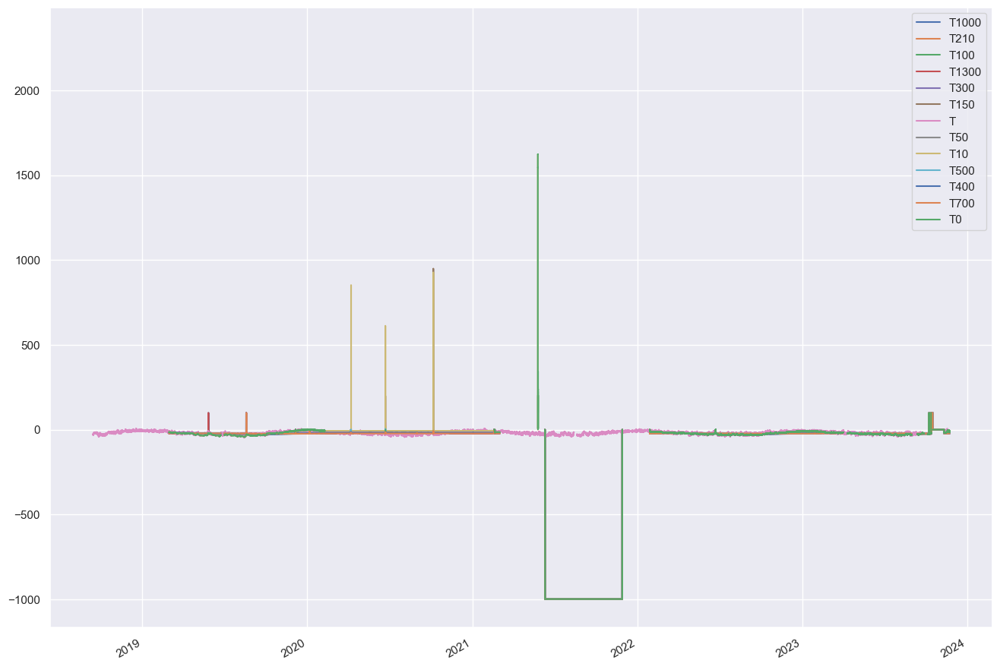

In [3]:
ax = taf.plot(figsize=(16,12))
#ax.set_ylim(-40,10)

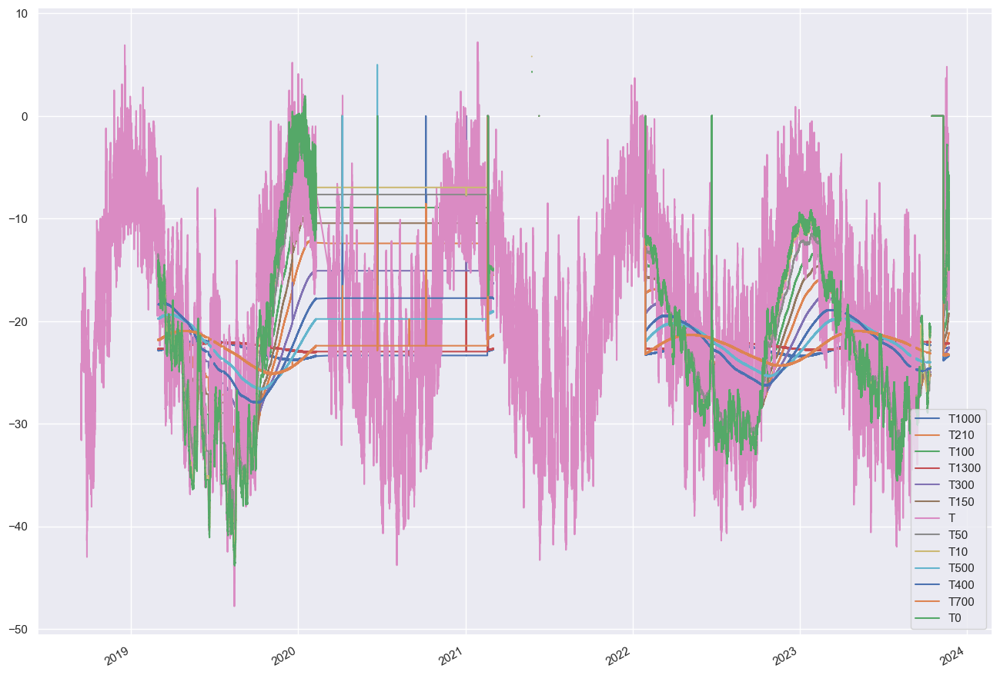

In [4]:
tafn = taf
tafn[taf>10] = np.nan
tafn[taf<-50] = np.nan
tafn['2019-12-06 13:09:00':'2019-12-06 16:30:00'] = np.nan
tafn['2020-01-06 10:20:00':'2020-01-06 10:48:00'] = np.nan
ax = tafn.plot(figsize=(16,12))

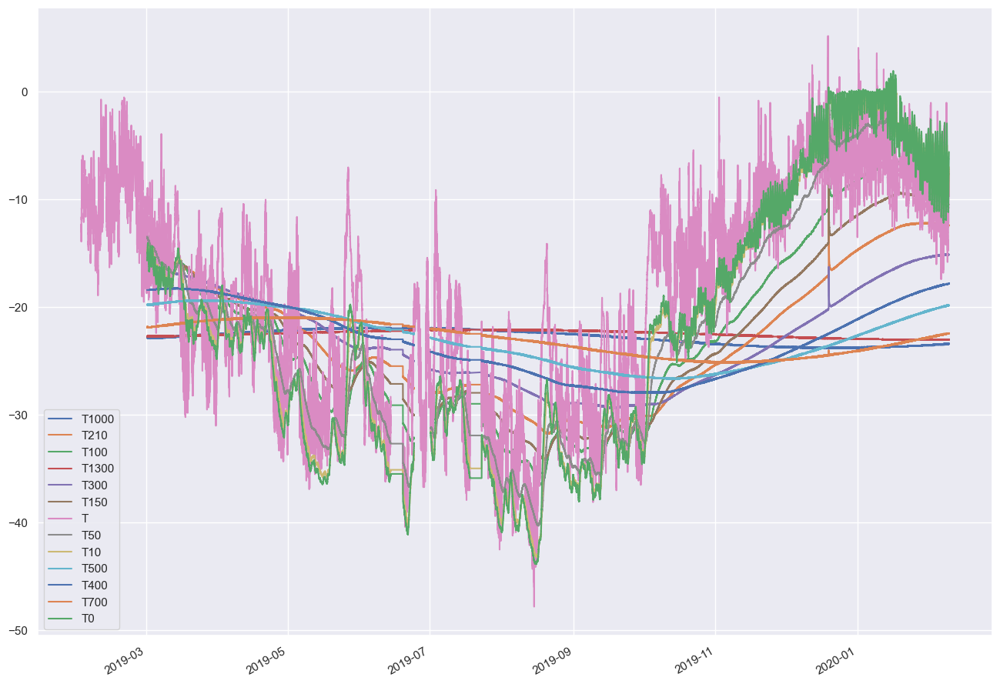

In [5]:
ax = tafn.loc['2019-02':'2020-02',:].plot(figsize=(16,12))

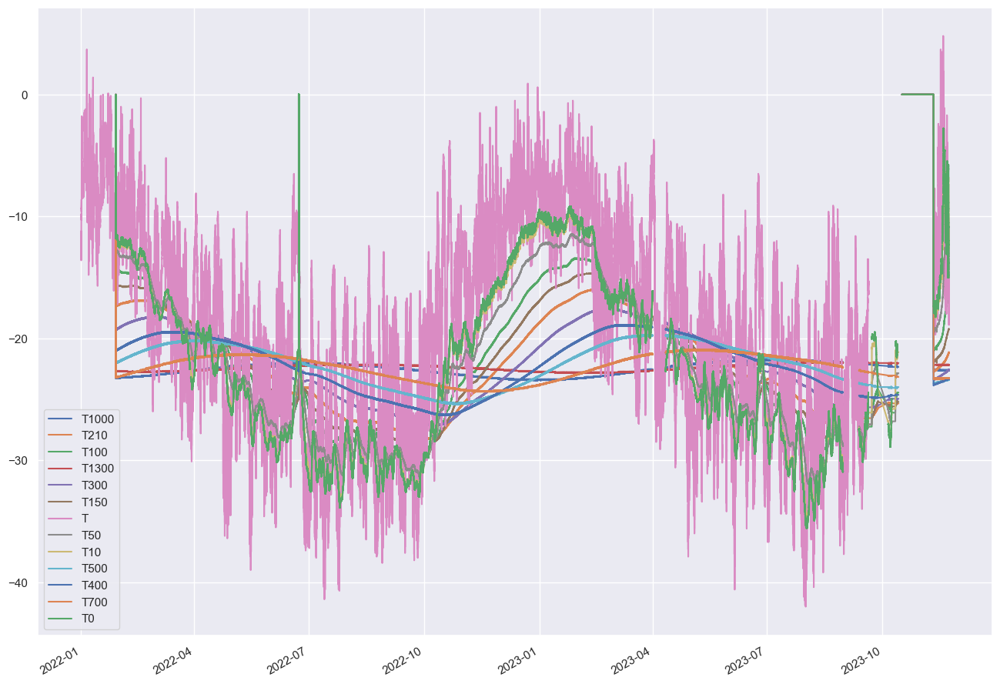

In [6]:
ax = tafn.loc['2022':'2023',:].plot(figsize=(16,12))

In [7]:
tafn3 = tafn.resample('3H').mean()
tafn3.index = tafn3.index.shift(90,'T')
tafn3.rename(columns={'T':'Air', 'T0':'Surface', 'T10':'10 cm', 'T50':'50 cm', 'T100':'100 cm',
                    'T150':'150 cm', 'T210':'210 cm', 'T300':'3 m', 'T400':'4 m',
                    'T500':'5 m', 'T700':'7 m', 'T1000':'10 m', 'T1300':'13 m'}, inplace=True)

In [8]:
tafn3.reset_index(names='time').melt(id_vars='time', var_name='loc', value_name='T')

,time,loc,T
0,2018-09-14 07:30:00+00:00,10 m,NaN
1,2018-09-14 10:30:00+00:00,10 m,NaN
2,2018-09-14 13:30:00+00:00,10 m,NaN
3,2018-09-14 16:30:00+00:00,10 m,NaN
4,2018-09-14 19:30:00+00:00,10 m,NaN
...,...,...,...
197153,2023-11-22 10:30:00+00:00,Surface,-8.671852
197154,2023-11-22 13:30:00+00:00,Surface,-6.330349
197155,2023-11-22 16:30:00+00:00,Surface,-6.952209
197156,2023-11-22 19:30:00+00:00,Surface,-10.508765


In [9]:
fig = px.line(tafn3.loc['2019-02':'2020-02',
                        ['Air', 'Surface', '10 cm', '50 cm', '100 cm', '150 cm',
                         '210 cm', '3 m', '4 m', '5 m', '7 m', '10 m', '13 m']]
             .reset_index(names='Time').melt(id_vars='Time', var_name='Location', value_name='Temperature (°C)'),
             x='Time', y='Temperature (°C)', line_group='Location',
             color='Location', line_dash='Location',
             color_discrete_map={'Air': 'lightslategray',
                                 'Surface': 'orange',
                                 '10 cm': 'yellow',
                                 '50 cm': 'springgreen',
                                 '100 cm': 'aqua',
                                 '150 cm': 'lightseagreen',
                                 '210 cm': 'deepskyblue',
                                 '3 m': 'blue',
                                 '4 m': 'slateblue',
                                 '5 m': 'magenta',
                                 '7 m': 'darkviolet',
                                 '10 m': 'purple',
                                 '13 m': 'mediumvioletred'},
             line_dash_map={'Air': 'dash',
                                 'Surface': 'solid',
                                 '10 cm': 'solid',
                                 '50 cm': 'solid',
                                 '100 cm': 'solid',
                                 '150 cm': 'solid',
                                 '210 cm': 'solid',
                                 '3 m': 'solid',
                                 '4 m': 'solid',
                                 '5 m': 'solid',
                                 '7 m': 'solid',
                                 '10 m': 'dash',
                                 '13 m': 'solid'},
             title='<b>2019–2020 Ice temperatures</b>  Click and drag to zoom; turn lines off/on by clicking on legend')
fig.show()
fig.write_html('T_ice_19-20.html')

In [10]:
fig = px.line(tafn3.loc['2022-02':'2023-10',
                        ['Air', 'Surface', '10 cm', '50 cm', '100 cm', '150 cm',
                         '210 cm', '3 m', '4 m', '5 m', '7 m', '10 m', '13 m']]
             .reset_index(names='Time').melt(id_vars='Time', var_name='Location', value_name='Temperature (°C)'),
             x='Time', y='Temperature (°C)', line_group='Location',
             color='Location', line_dash='Location',
             color_discrete_map={'Air': 'lightslategray',
                                 'Surface': 'orange',
                                 '10 cm': 'yellow',
                                 '50 cm': 'springgreen',
                                 '100 cm': 'aqua',
                                 '150 cm': 'lightseagreen',
                                 '210 cm': 'deepskyblue',
                                 '3 m': 'blue',
                                 '4 m': 'slateblue',
                                 '5 m': 'magenta',
                                 '7 m': 'darkviolet',
                                 '10 m': 'purple',
                                 '13 m': 'mediumvioletred'},
             line_dash_map={'Air': 'dash',
                                 'Surface': 'solid',
                                 '10 cm': 'solid',
                                 '50 cm': 'solid',
                                 '100 cm': 'solid',
                                 '150 cm': 'solid',
                                 '210 cm': 'solid',
                                 '3 m': 'solid',
                                 '4 m': 'solid',
                                 '5 m': 'solid',
                                 '7 m': 'solid',
                                 '10 m': 'dash',
                                 '13 m': 'solid'},
             title='<b>2022–2023 Ice temperatures</b>  Click and drag to zoom; turn lines off/on by clicking on legend')
fig.show()
fig.write_html('T_ice_22-23.html')